In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.4 MB/s eta 0:00:00


In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 111.6 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-2.1179, -2.1179, -1.8953,  ..., -0.1828, -0.1828, -0.1828],
         [-1.8268, -1.8953, -1.8953,  ..., -0.3541, -0.3541, -0.3541],
         [-1.8268, -1.8268, -1.8268,  ..., -0.7650, -0.7822, -0.7822],
         ...,
         [-2.0152, -1.9809, -1.9638,  ..., -0.9705, -0.9705, -0.9705],
         [-2.0494, -2.0494, -2.0323,  ..., -0.9705, -0.9705, -0.9705],
         [-2.1008, -2.0665, -2.0494,  ..., -0.9705, -0.9705, -0.9705]],

        [[-1.8782, -1.8081, -1.5630,  ..., -0.0224, -0.0224, -0.0224],
         [-1.4930, -1.5630, -1.5630,  ..., -0.1975, -0.1975, -0.1975],
         [-1.4930, -1.4930, -1.5105,  ..., -0.6176, -0.6352, -0.6352],
         ...,
         [-1.6331, -1.5980, -1.5805,  ..., -1.1954, -1.1954, -1.1779],
         [-1.6681, -1.6681, -1.6506,  ..., -1.1779, -1.1779, -1.1779],
         [-1.7031, -1.6856, -1.6681,  ..., -1.1779, -1.1779, -1.1604]],

        [[-1.8044, -1.7522, -1.5081,  ...,  0.1128,  0.1128,  0.1128],
         [-1.4559, -1.5081, -1.5081,  ..., -0

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3Plus(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3Plus, self).__init__()
        self.base_model = smp.DeepLabV3Plus(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3Plus(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.4 MB/s eta 0:00:00


In [53]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [54]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3Plus(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [55]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-15 15:55:25,622] A new study created in memory with name: no-name-da41ca79-56b4-47c4-9faa-cbc281f7611f


Trial 0: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 1/25:
Train loss: 0.157130542728636, Train Avg IoU: 0.5646842711506124



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.12635225802659988, Val Avg IoU: 0.6706587731792308



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 2/25:
Train loss: 0.13755123110281098, Train Avg IoU: 0.6553098424752727



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.11931739250818889, Val Avg IoU: 0.689585850712521



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 3/25:
Train loss: 0.12619898716608682, Train Avg IoU: 0.7003327907088601



100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


Val loss: 0.11124544342358907, Val Avg IoU: 0.7473972955340477



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 4/25:
Train loss: 0.12274596591790517, Train Avg IoU: 0.7228655934766435



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.10628573099772136, Val Avg IoU: 0.7808481435451982



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 5/25:
Train loss: 0.11950542281071345, Train Avg IoU: 0.7272911325192405



100%|██████████| 3/3 [00:01<00:00,  2.48it/s]


Val loss: 0.0998576432466507, Val Avg IoU: 0.8014173622140476



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 6/25:
Train loss: 0.11335438903835085, Train Avg IoU: 0.7454642199832928



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.09492019067207973, Val Avg IoU: 0.8201168848968586



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 7/25:
Train loss: 0.11082703413234817, Train Avg IoU: 0.7704149694206502



100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


Val loss: 0.09298708786567052, Val Avg IoU: 0.8291369291800295



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 8/25:
Train loss: 0.10474651844965087, Train Avg IoU: 0.7951536354036484



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.08958324293295543, Val Avg IoU: 0.8400209417629695



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 9/25:
Train loss: 0.10513359225458568, Train Avg IoU: 0.7937461002523061



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.09352767964204152, Val Avg IoU: 0.8108131480122384



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 10/25:
Train loss: 0.10231255574358834, Train Avg IoU: 0.7998786286662583



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.08753981441259384, Val Avg IoU: 0.8421028629960742



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 11/25:
Train loss: 0.0995614847375287, Train Avg IoU: 0.8027221884977723



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.08550395319859187, Val Avg IoU: 0.847484725985725



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 12/25:
Train loss: 0.10136573471956783, Train Avg IoU: 0.8089814258426812



100%|██████████| 3/3 [00:01<00:00,  2.69it/s]


Val loss: 0.08502435187498729, Val Avg IoU: 0.8450904639282983



100%|██████████| 18/18 [00:11<00:00,  1.64it/s]


Epoch 13/25:
Train loss: 0.09505423282583554, Train Avg IoU: 0.8212342583591206



100%|██████████| 3/3 [00:01<00:00,  2.56it/s]


Val loss: 0.08420695116122563, Val Avg IoU: 0.8457357655498075



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 14/25:
Train loss: 0.09740712079736921, Train Avg IoU: 0.8190960675004351



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.08375157912572224, Val Avg IoU: 0.8456595172528526



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 15/25:
Train loss: 0.0955585241317749, Train Avg IoU: 0.8202799618395084



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.08270285775264104, Val Avg IoU: 0.8491837473833027



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 16/25:
Train loss: 0.09568416658374998, Train Avg IoU: 0.8076995378826846



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.08272605886061986, Val Avg IoU: 0.8447072556474634



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 17/25:
Train loss: 0.09537846015559302, Train Avg IoU: 0.8100053481819401



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.08151835203170776, Val Avg IoU: 0.8519795660214032



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 18/25:
Train loss: 0.09380371040768093, Train Avg IoU: 0.8210662845909824



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.08253781000773112, Val Avg IoU: 0.8442169739099391



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 19/25:
Train loss: 0.09309958459602462, Train Avg IoU: 0.8293317636836743



100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


Val loss: 0.08107722053925197, Val Avg IoU: 0.851636055227864



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 20/25:
Train loss: 0.09407058109839757, Train Avg IoU: 0.8211393631922317



100%|██████████| 3/3 [00:01<00:00,  2.49it/s]


Val loss: 0.0807723378141721, Val Avg IoU: 0.8528907189226868



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 21/25:
Train loss: 0.09075614520245129, Train Avg IoU: 0.8345178457782739



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.08052846789360046, Val Avg IoU: 0.8538035275241196



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 22/25:
Train loss: 0.09283863463335568, Train Avg IoU: 0.8264380897111971



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.08058956762154897, Val Avg IoU: 0.85290903208782



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.09090605833464199, Train Avg IoU: 0.8366995857942962



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.08045440912246704, Val Avg IoU: 0.8534776423179883



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 24/25:
Train loss: 0.09133779630064964, Train Avg IoU: 0.8342530284164202



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.08051770428816478, Val Avg IoU: 0.852843771744868



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 25/25:
Train loss: 0.09275383460852835, Train Avg IoU: 0.8282140039173899



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]
[I 2025-11-15 16:00:16,524] Trial 0 finished with value: 0.08045440912246704 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.08045440912246704.


Val loss: 0.08050264418125153, Val Avg IoU: 0.8529437858347556

Trial 1: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 1/25:
Train loss: 0.1650748931699329, Train Avg IoU: 0.5298392268152675



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.13562985012928644, Val Avg IoU: 0.6591967339645147



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 2/25:
Train loss: 0.14090722137027317, Train Avg IoU: 0.6447885806840954



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.1226897860566775, Val Avg IoU: 0.7033142641919392



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 3/25:
Train loss: 0.13318751255671182, Train Avg IoU: 0.6890721245898054



100%|██████████| 3/3 [00:01<00:00,  2.49it/s]


Val loss: 0.11876457184553146, Val Avg IoU: 0.7200422979376594



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 4/25:
Train loss: 0.12720122022761238, Train Avg IoU: 0.7107830450211916



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.11116899053255717, Val Avg IoU: 0.7806537629520903



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 5/25:
Train loss: 0.12030092461241616, Train Avg IoU: 0.750775216488963



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.10687405616044998, Val Avg IoU: 0.8031299392987844



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 6/25:
Train loss: 0.11600682925846842, Train Avg IoU: 0.7608673560488449



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.10305970410505931, Val Avg IoU: 0.8242242780120067



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.11730243927902645, Train Avg IoU: 0.766086245750411



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.10322801520427068, Val Avg IoU: 0.8141764739736134



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 8/25:
Train loss: 0.11270120160447226, Train Avg IoU: 0.7830975042386098



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.0968358467022578, Val Avg IoU: 0.841844776034334



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 9/25:
Train loss: 0.10568506601783964, Train Avg IoU: 0.8115458494236232



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.0954159473379453, Val Avg IoU: 0.839263431514603



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 10/25:
Train loss: 0.10764605676134427, Train Avg IoU: 0.7988185367428886



100%|██████████| 3/3 [00:01<00:00,  2.59it/s]


Val loss: 0.09626119087139766, Val Avg IoU: 0.8270119450535027



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 11/25:
Train loss: 0.1047561081747214, Train Avg IoU: 0.8072426109946471



100%|██████████| 3/3 [00:01<00:00,  2.40it/s]


Val loss: 0.09079710890849431, Val Avg IoU: 0.850493489148406



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 12/25:
Train loss: 0.102911157740487, Train Avg IoU: 0.8119628221736298



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.09321045875549316, Val Avg IoU: 0.8295044036138058



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 13/25:
Train loss: 0.0993381105363369, Train Avg IoU: 0.8164865850459173



100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


Val loss: 0.08811364074548085, Val Avg IoU: 0.8518960293446969



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 14/25:
Train loss: 0.09756466787722376, Train Avg IoU: 0.8247913602292662



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.08757421622673671, Val Avg IoU: 0.8514471569427737



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 15/25:
Train loss: 0.09530588860313098, Train Avg IoU: 0.8257908966007864



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.08488761881987254, Val Avg IoU: 0.8568623769966689



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 16/25:
Train loss: 0.0946179868446456, Train Avg IoU: 0.8270756577411609



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.08558903137842815, Val Avg IoU: 0.8466915684849589



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.09466607413358158, Train Avg IoU: 0.8236019955765932



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.08253961056470871, Val Avg IoU: 0.857273083797916



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 18/25:
Train loss: 0.09816931808988254, Train Avg IoU: 0.8055730683064214



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.08472234259049098, Val Avg IoU: 0.8417062145941551



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 19/25:
Train loss: 0.09169654217031267, Train Avg IoU: 0.8223441948508095



100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


Val loss: 0.08153902490933736, Val Avg IoU: 0.8545232344618934



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 20/25:
Train loss: 0.09366694299711122, Train Avg IoU: 0.8232647877158921



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.08102371295293172, Val Avg IoU: 0.8500772308840396



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 21/25:
Train loss: 0.08890799267424478, Train Avg IoU: 0.8356943175346496



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.07946326335271199, Val Avg IoU: 0.8547279655393013



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 22/25:
Train loss: 0.08942837143937747, Train Avg IoU: 0.8317742078849274



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.08066708346207936, Val Avg IoU: 0.8443512269051704



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 23/25:
Train loss: 0.08963465400867993, Train Avg IoU: 0.8210810372097199



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.08248403668403625, Val Avg IoU: 0.8355486160151329



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 24/25:
Train loss: 0.09256453687946002, Train Avg IoU: 0.8014781219255629



100%|██████████| 3/3 [00:01<00:00,  2.86it/s]


Val loss: 0.07811866452296574, Val Avg IoU: 0.8487181517212116



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 25/25:
Train loss: 0.0889490255051189, Train Avg IoU: 0.8185315372447117



100%|██████████| 3/3 [00:01<00:00,  2.43it/s]
[I 2025-11-15 16:05:06,529] Trial 1 finished with value: 0.07642598201831181 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 1 with value: 0.07642598201831181.


Val loss: 0.07642598201831181, Val Avg IoU: 0.8553471244949007

Trial 2: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 1/25:
Train loss: 0.16185492277145386, Train Avg IoU: 0.5408680984982133



100%|██████████| 3/3 [00:01<00:00,  2.57it/s]


Val loss: 0.131956048309803, Val Avg IoU: 0.6472300328636583



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 2/25:
Train loss: 0.1379337530169222, Train Avg IoU: 0.64472412807942



100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


Val loss: 0.11838844915231068, Val Avg IoU: 0.688032537208867



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 3/25:
Train loss: 0.1271997123128838, Train Avg IoU: 0.6732013722443159



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.11217573036750157, Val Avg IoU: 0.7126930960219179



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 4/25:
Train loss: 0.12064241617918015, Train Avg IoU: 0.7147558118083593



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.10187072306871414, Val Avg IoU: 0.7761208075385265



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 5/25:
Train loss: 0.11369465167323749, Train Avg IoU: 0.7498735892533703



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.09472084790468216, Val Avg IoU: 0.8135104553401281



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 6/25:
Train loss: 0.10796238564782673, Train Avg IoU: 0.7755779721472211



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.09200211614370346, Val Avg IoU: 0.8255682754205963



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 7/25:
Train loss: 0.1059988790916072, Train Avg IoU: 0.7786652795604392



100%|██████████| 3/3 [00:01<00:00,  2.91it/s]


Val loss: 0.09059914698203404, Val Avg IoU: 0.8291702808036198



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 8/25:
Train loss: 0.10181776392791006, Train Avg IoU: 0.7969194531744493



100%|██████████| 3/3 [00:01<00:00,  2.69it/s]


Val loss: 0.08982623368501663, Val Avg IoU: 0.8297130571851367



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 9/25:
Train loss: 0.10225178425510724, Train Avg IoU: 0.7953540588925937



100%|██████████| 3/3 [00:01<00:00,  2.51it/s]


Val loss: 0.08615672091643016, Val Avg IoU: 0.8443288416079645



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 10/25:
Train loss: 0.0987599098847972, Train Avg IoU: 0.8080908636179323



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.08520783732334773, Val Avg IoU: 0.8430506662175344



100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


Epoch 11/25:
Train loss: 0.09593010031514698, Train Avg IoU: 0.8149324822381272



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.0844095175464948, Val Avg IoU: 0.8468115645578927



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 12/25:
Train loss: 0.09795711727605926, Train Avg IoU: 0.8140893671163938



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.08367502441008885, Val Avg IoU: 0.8496494289793044



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 13/25:
Train loss: 0.0992608190410667, Train Avg IoU: 0.800606769283631



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.08495729913314183, Val Avg IoU: 0.8398569420488696



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 14/25:
Train loss: 0.09630446135997772, Train Avg IoU: 0.8077226849916993



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.08362925052642822, Val Avg IoU: 0.8451992456626601



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 15/25:
Train loss: 0.09732138655251926, Train Avg IoU: 0.8077347241752486



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]


Val loss: 0.08345880607763927, Val Avg IoU: 0.844199331066697



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 16/25:
Train loss: 0.0955315882133113, Train Avg IoU: 0.8149644009591536



100%|██████████| 3/3 [00:01<00:00,  2.62it/s]


Val loss: 0.08207694192727406, Val Avg IoU: 0.8491440376348885



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 17/25:
Train loss: 0.09427574235532019, Train Avg IoU: 0.8207001567269168



100%|██████████| 3/3 [00:01<00:00,  2.50it/s]


Val loss: 0.0815754160284996, Val Avg IoU: 0.8511950338562561



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 18/25:
Train loss: 0.09333434452613194, Train Avg IoU: 0.8233621200967187



100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


Val loss: 0.08179625868797302, Val Avg IoU: 0.8505232259052974



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 19/25:
Train loss: 0.09124168753623962, Train Avg IoU: 0.8272910587380067



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.08165257175763448, Val Avg IoU: 0.8485592132859597



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 20/25:
Train loss: 0.09365482752521832, Train Avg IoU: 0.8250690047219487



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.08107427010933559, Val Avg IoU: 0.8514460611213436



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 21/25:
Train loss: 0.09165990435414845, Train Avg IoU: 0.8275799131937591



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.08106088638305664, Val Avg IoU: 0.8504432463981916



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 22/25:
Train loss: 0.09137233388092783, Train Avg IoU: 0.8333964915382313



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.08091303706169128, Val Avg IoU: 0.8516838865753651



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 23/25:
Train loss: 0.09222312644124031, Train Avg IoU: 0.8292474304719446



100%|██████████| 3/3 [00:01<00:00,  2.53it/s]


Val loss: 0.0807508925596873, Val Avg IoU: 0.851601505054029



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 24/25:
Train loss: 0.09325587956441773, Train Avg IoU: 0.822171054821768



100%|██████████| 3/3 [00:01<00:00,  2.48it/s]


Val loss: 0.08065697302420934, Val Avg IoU: 0.8516929200764096



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 25/25:
Train loss: 0.09119284898042679, Train Avg IoU: 0.8321571937801867



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]
[I 2025-11-15 16:09:57,648] Trial 2 finished with value: 0.08061785995960236 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 1 with value: 0.07642598201831181.


Val loss: 0.08061785995960236, Val Avg IoU: 0.8514252853326237



In [56]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}
Best val loss: 0.07642598201831181


In [57]:
fine_tune_model.eval()

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

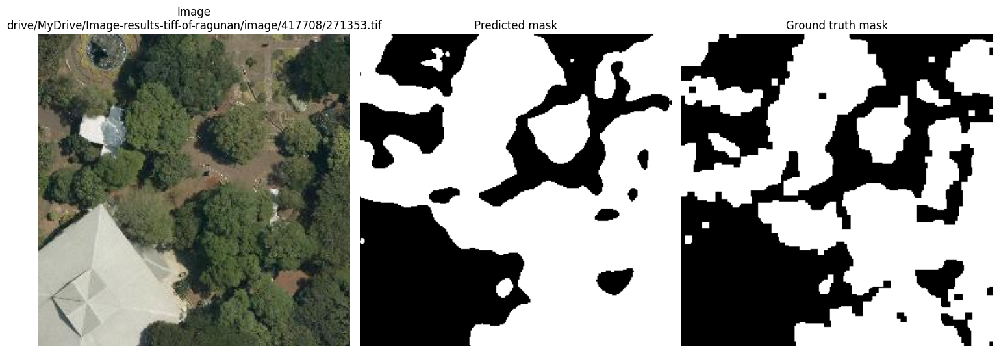

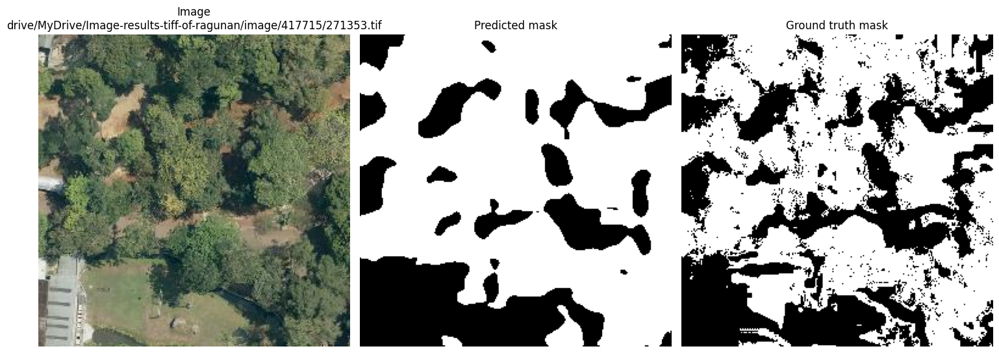

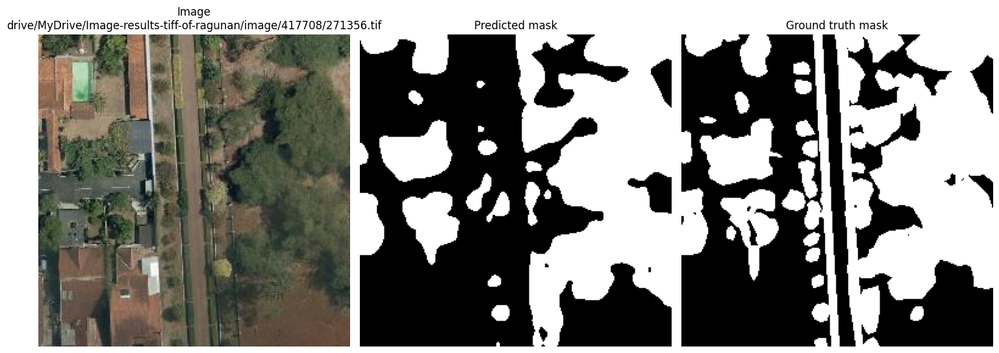

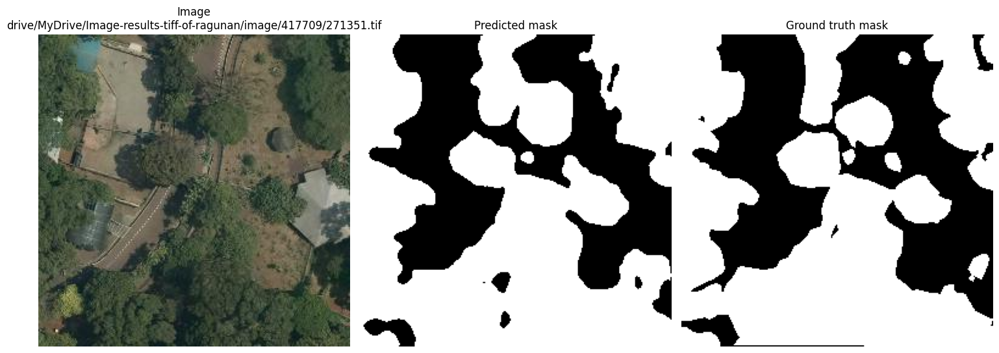

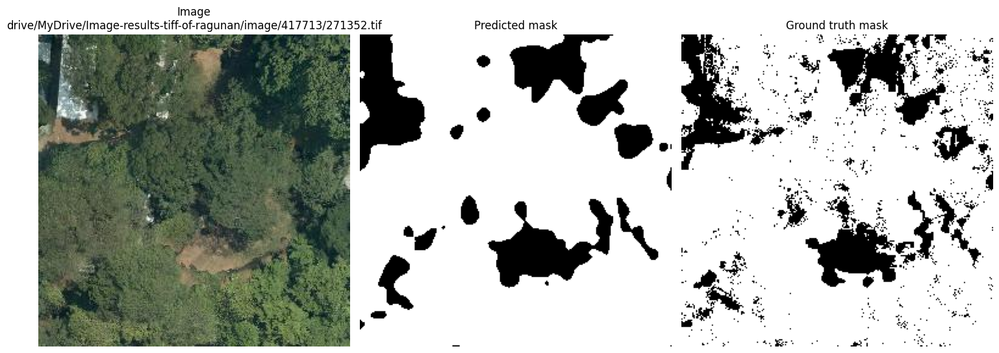

...

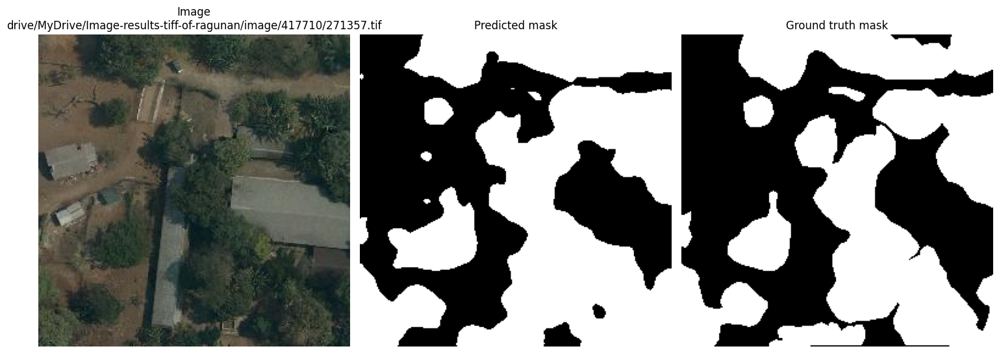

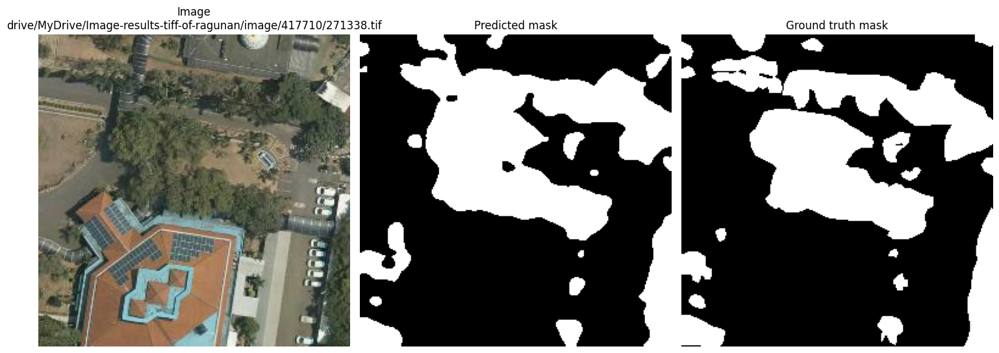

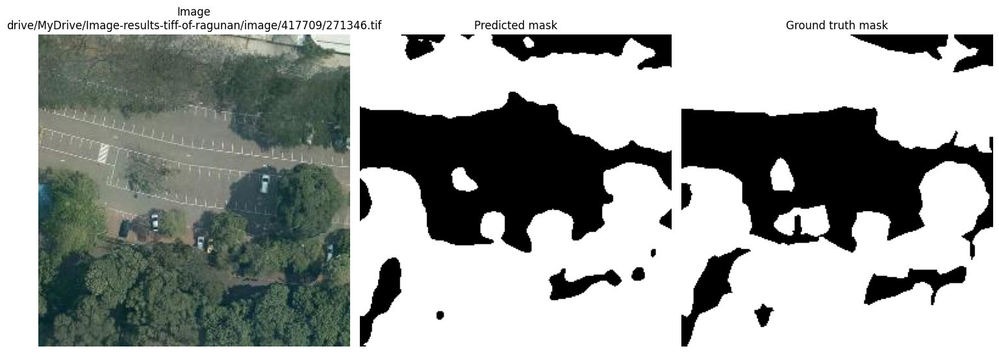

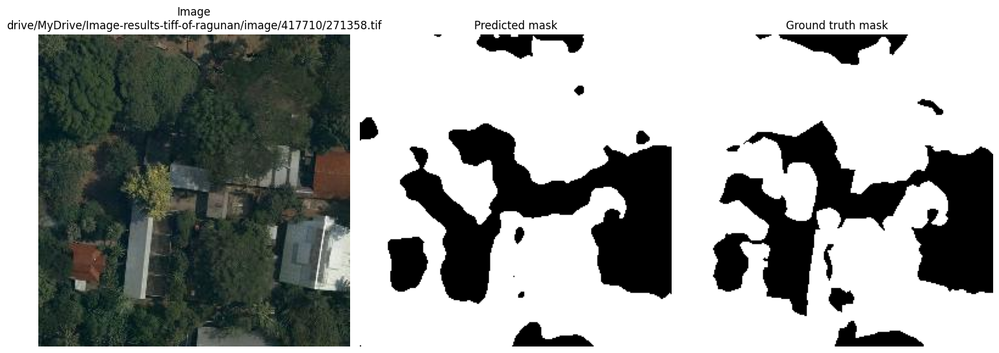

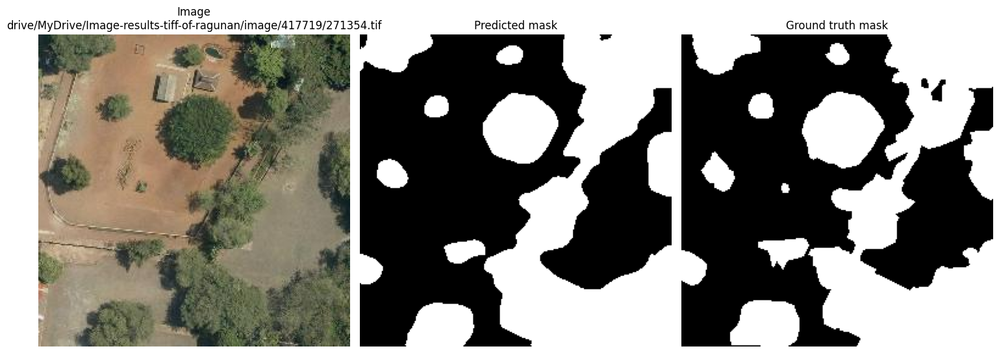

In [58]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [59]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [60]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40630
Vegetation coverage area: 22867.779363155696
IoU score: 0.821983796803153
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 45686
Vegetation coverage area: 3550.164480032457
IoU score: 0.7668103805654589
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 27595
Vegetation coverage area: 15531.291447853346
IoU score: 0.7332435360604375
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41320
Vegetation coverage area: 23256.13200309115
IoU score: 0.862730385030249
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 52998
Vege

In [63]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 22867.779363155696 m^2
Carbon density: 0.007127706663477083 ton/m^2
Estimated carbon stock: 162.9948233456886 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3550.164480032457 m^2
Carbon density: 0.007127706663477083 ton/m^2
Estimated carbon stock: 25.304531020766998 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 15531.291447853346 m^2
Carbon density: 0.007127706663477083 ton/m^2
Estimated carbon stock: 110.70248954526893 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 23256.13200309115 m^2
Carbon density: 0.007127706663477083 ton/m^2
Estimated carbon stock: 165.76288704513541 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4118.364862600362 m^2
Carbon density: 0.007